# Data Preparation

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from wordcloud import WordCloud

In [2]:
df = pd.read_csv("Online Retail.csv")

In [3]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


In [4]:
len(df)

541909

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   541909 non-null  int64  
 7   Country      541909 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 33.1+ MB


# Check data Duplication

In [6]:
# Check if any duplicated value in all rows
df.duplicated().sum()

5268

In [7]:
# Drop duplicate value
df = df.drop_duplicates()
# Check is there any duplicate value
df.duplicated().sum()

0

# Check missing Value

In [8]:
variables = []
dtypes = []
count = []
unique = []
missing = []


for item in df.columns:
    variables.append(item)
    dtypes.append(df[item].dtype)
    count.append(len(df[item]))
    unique.append(len(df[item].unique()))
    missing.append(df[item].isna().sum())

output = pd.DataFrame({
    'variable': variables, 
    'dtype': dtypes,
    'count': count,
    'unique': unique,
    'missing': missing, 
   
})    

output.sort_values("missing",ascending=False).reset_index(drop=True)
output

,variable,dtype,count,unique,missing
0,InvoiceNo,object,536641,25900,0
1,StockCode,object,536641,4070,0
2,Description,object,536641,4224,1454
3,Quantity,int64,536641,722,0
4,InvoiceDate,object,536641,23260,0
5,UnitPrice,float64,536641,1630,0
6,CustomerID,int64,536641,4372,0
7,Country,object,536641,38,0


# Data Preprocessing

## Fill missing value by reference StockCode

In [9]:
# Store the stock code from missing value
list_stockcode_from_missing = []
for item in df[df['Description'].isnull()]['StockCode']:
    list_stockcode_from_missing.append(item)

In [10]:
# find most suitable description based on stock code
def isNaN(string):
    return string != string
list_description_for_missing = []

for idx,code in enumerate(df['StockCode']):
    for stock in list_stockcode_from_missing:
        if(code == stock):
            if(isNaN(df['Description'].iloc[idx])):
                continue
            list_description_for_missing.append(df['Description'].iloc[idx])
            break
    if(len(list_description_for_missing) == len(list_stockcode_from_missing)):
        break
        
len(list_description_for_missing)

1454

In [11]:
idx_list = df[df['Description'].isnull()].index

desc_data = pd.Series(list_description_for_missing,index = idx_list)

In [12]:
# Fill missing value from description list that we get from stockcode 

df['Description'].fillna(desc_data,inplace=True)
# check it again
df.isnull().sum()

InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

##  stock code with letter

In [13]:
filtered_df = df[df['StockCode'].str.contains('^[A-Z]$')]
filtered_stockcodes = filtered_df['StockCode'].unique()
filtered_df = df[df['StockCode'].isin(filtered_stockcodes)]
filtered_df = filtered_df.drop_duplicates(subset=['StockCode'])
filtered_df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527,United Kingdom
2239,536569,M,Manual,1,2010-12-01 15:35:00,1.25,16274,United Kingdom
14436,C537581,S,SAMPLES,-1,2010-12-07 12:03:00,12.95,15287,United Kingdom
299982,A563185,B,Adjust bad debt,1,2011-08-12 14:50:00,11062.06,15287,United Kingdom


In [14]:
# I think the code just some code not a sales code then we need to remove it
df = df[~df['StockCode'].isin(filtered_stockcodes)]
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France


## Quantity or UnitPrice of stuff < 0

In [15]:
# Quantity 0 show all unit Price nan, i think the data has error input. 
df.loc[df['Quantity'] < 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom
238,C536391,21980,PACK OF 12 RED RETROSPOT TISSUES,-24,2010-12-01 10:24:00,0.29,17548,United Kingdom
...,...,...,...,...,...,...,...,...
540448,C581490,22178,VICTORIAN GLASS HANGING T-LIGHT,-12,2011-12-09 09:57:00,1.95,14397,United Kingdom
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315,United Kingdom


In [16]:
df.loc[df['Quantity'] < 0, 'Quantity'] = df['Quantity'].abs()

In [17]:
# There is no minus value in unit Price
df.loc[df['UnitPrice'] < 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country


## Quantity or UnitPrice of stuff = 0

In [18]:
df.loc[df['Quantity'] == 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country


In [19]:
df.loc[df['UnitPrice'] == 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,CREAM CUPID HEARTS COAT HANGER,56,2010-12-01 11:52:00,0.0,15287,United Kingdom
1970,536545,21134,KNITTED UNION FLAG HOT WATER BOTTLE,1,2010-12-01 14:32:00,0.0,15287,United Kingdom
1971,536546,22145,RED WOOLLY HOTTIE WHITE HEART.,1,2010-12-01 14:33:00,0.0,15287,United Kingdom
1972,536547,37509,HAND WARMER UNION JACK,1,2010-12-01 14:33:00,0.0,15287,United Kingdom
1987,536549,85226A,HAND WARMER RED POLKA DOT,1,2010-12-01 14:34:00,0.0,15287,United Kingdom
...,...,...,...,...,...,...,...,...
536981,581234,72817,ENVELOPE 50 BLOSSOM IMAGES,27,2011-12-08 10:33:00,0.0,15287,United Kingdom
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,2011-12-08 13:58:00,0.0,15287,United Kingdom
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,2011-12-08 13:58:00,0.0,15287,United Kingdom
538554,581408,85175,JUMBO BAG STRAWBERRY,20,2011-12-08 14:06:00,0.0,15287,United Kingdom


In [20]:
# I think the unit price 0 will be same with no sales then we cannot count the sales it will be removed
df = df.loc[df['UnitPrice'] != 0]

## InvoiceDate to datetime

In [21]:
# Invoice date datetime
# Change invoicedate to datetime type
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'],dayfirst = True)
df['InvoiceDate']

C:\Users\user\AppData\Local\Temp\ipykernel_300\3816374746.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'],dayfirst = True)


0        2010-12-01 08:26:00
1        2010-12-01 08:26:00
2        2010-12-01 08:26:00
3        2010-12-01 08:26:00
4        2010-12-01 08:26:00
                 ...        
541904   2011-12-09 12:50:00
541905   2011-12-09 12:50:00
541906   2011-12-09 12:50:00
541907   2011-12-09 12:50:00
541908   2011-12-09 12:50:00
Name: InvoiceDate, Length: 533429, dtype: datetime64[ns]

In [22]:
# Let's create column for each month,year, and day of week
df['year']= df['InvoiceDate'].dt.year

df['month']= df['InvoiceDate'].dt.month

df['day']= df['InvoiceDate'].dt.day

df['weekday']= df['InvoiceDate'].dt.weekday

dw_mapping={
    0: 'Monday', 
    1: 'Tuesday', 
    2: 'Wednesday', 
    3: 'Thursday', 
    4: 'Friday',
    5: 'Saturday', 
    6: 'Sunday'
} 

df['dayofweek']= df['InvoiceDate'].dt.weekday.map(dw_mapping)

C:\Users\user\AppData\Local\Temp\ipykernel_300\2009336480.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year']= df['InvoiceDate'].dt.year
C:\Users\user\AppData\Local\Temp\ipykernel_300\2009336480.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month']= df['InvoiceDate'].dt.month
C:\Users\user\AppData\Local\Temp\ipykernel_300\2009336480.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

S

In [23]:
# Create new column with time interval labels
df['Time'] = pd.to_datetime(df['InvoiceDate']).dt.hour
df['Time of Day'] = ['Early Morning' if x < 6 
                     else ('Morning' if x < 12 
                           else ('Noon' if x < 14 
                                 else ('Afternoon' if x < 18 
                                       else ('Evening' if x < 22 else 'Night')))) for x in df['Time']]

C:\Users\user\AppData\Local\Temp\ipykernel_300\110255243.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Time'] = pd.to_datetime(df['InvoiceDate']).dt.hour
C:\Users\user\AppData\Local\Temp\ipykernel_300\110255243.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Time of Day'] = ['Early Morning' if x < 6


## Change customerId to int

In [24]:
# customerid to int
df['CustomerID'] = df['CustomerID'].astype(str)

C:\Users\user\AppData\Local\Temp\ipykernel_300\2026469687.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CustomerID'] = df['CustomerID'].astype(str)


## Sales

In [25]:
# Sales = qty * price
df['Sales'] = df['Quantity'] * df['UnitPrice']
df['Sales'].head()

C:\Users\user\AppData\Local\Temp\ipykernel_300\2569449882.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sales'] = df['Quantity'] * df['UnitPrice']


0    15.30
1    20.34
2    22.00
3    20.34
4    20.34
Name: Sales, dtype: float64

# describe Value

In [26]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Quantity,533429.0,10.939925,216.506796,1.000,1.00,3.00,11.00,80995.00
UnitPrice,533429.0,4.262886,72.843081,0.001,1.25,2.10,4.13,17836.46
year,533429.0,2010.921900,0.268330,2010.000,2011.00,2011.00,2011.00,2011.00
month,533429.0,7.548215,3.508591,1.000,5.00,8.00,11.00,12.00
day,533429.0,15.019661,8.660336,1.000,7.00,15.00,22.00,31.00
weekday,533429.0,2.425955,1.841709,0.000,1.00,2.00,4.00,6.00
Time,533429.0,13.075178,2.448098,6.000,11.00,13.00,15.00,20.00
Sales,533429.0,21.168013,375.957670,0.001,3.90,9.92,17.70,168469.60


In [27]:
df.describe(include='object')

,InvoiceNo,StockCode,Description,CustomerID,Country,dayofweek,Time of Day
count,533429,533429,533429,533429,533429,533429,533429
unique,23453,3934,4039,4362,38,6,4
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,15287,United Kingdom,Thursday,Afternoon
freq,1114,2295,2353,132417,487199,102428,224359


# EDA

## Melakukan analisa untuk menentukan perilaku dan preferensi pelanggan

### Distribusi transaksi di tiap negara

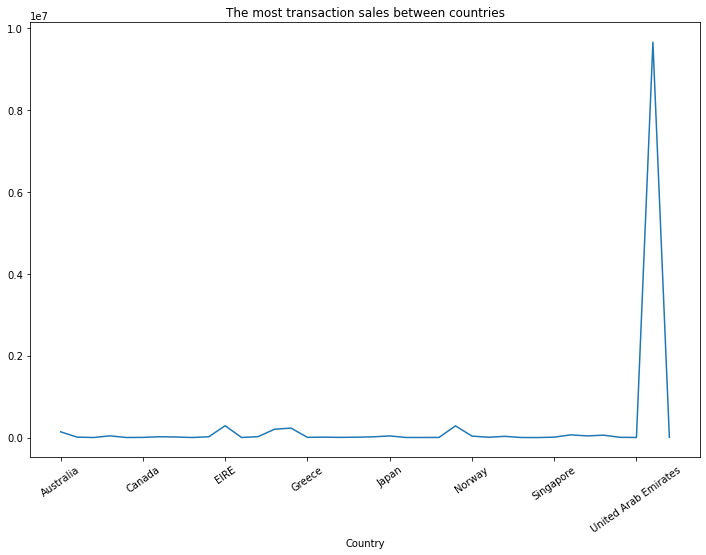

In [28]:
df_country['Sales'].plot(kind='line', figsize=(12,8))
plt.title("The most transaction sales between countries")
plt.xticks(rotation=35)
plt.show()

In [30]:
df_country

,Quantity,UnitPrice,year,month,day,weekday,Time,Sales
Country,,,,,,,,
Australia,84447,4048.000,2523771,7662,18328,2862,14337,139897.850
Austria,4935,1701.520,806402,3058,6641,712,4881,10243.040
Bahrain,368,86.570,38208,98,218,14,259,959.880
Belgium,23322,7540.130,4160664,15284,31795,5519,25327,41481.720
Brazil,356,142.600,64352,128,480,128,320,1143.600
Canada,2763,910.580,303661,963,2271,21,1490,3666.380
Channel Islands,9495,3150.900,1518288,5130,10405,1837,8315,20218.690
Cyprus,6382,3238.660,1224617,4434,7515,1403,7320,13505.560
Czech Republic,750,88.150,60330,171,546,60,283,945.760


In [31]:
import pandas as pd
from tabulate import tabulate

# Assuming you have a DataFrame named df
description_table = df_country

# Convert the table to Markdown format
markdown_table = tabulate(description_table, headers='keys', tablefmt='pipe')

# Print the Markdown table
print(markdown_table)

| Country              |         Quantity |       UnitPrice |             year |           month |              day |       weekday |             Time |            Sales |
|:---------------------|-----------------:|----------------:|-----------------:|----------------:|-----------------:|--------------:|-----------------:|-----------------:|
| Australia            |  84447           |  4048           |      2.52377e+06 |  7662           |  18328           |  2862         |  14337           | 139898           |
| Austria              |   4935           |  1701.52        | 806402           |  3058           |   6641           |   712         |   4881           |  10243           |
| Bahrain              |    368           |    86.57        |  38208           |    98           |    218           |    14         |    259           |    959.88        |
| Belgium              |  23322           |  7540.13        |      4.16066e+06 | 15284           |  31795           |  5519         |  25327

In [29]:
# Group the data by 'Country' and calculate the total transaction count
transactions_per_month = df.groupby(['Country', df['InvoiceDate'].dt.strftime('%m-%Y')]).size().reset_index(name='Transaction Count')
total_transactions_by_country = transactions_per_month.groupby('Country')['Transaction Count'].sum().reset_index()

# Sort the total transaction counts in descending order
total_transactions_by_country = total_transactions_by_country.sort_values('Transaction Count', ascending=False)

# Create a treemap using Plotly Express
fig = px.treemap(total_transactions_by_country, 
                 path=['Country'], 
                 values='Transaction Count', 
                 color='Country',  # Use 'Country' as the color variable
                 color_discrete_sequence=px.colors.qualitative.Prism,  # Specify the discrete color sequence
                 title='Distribution of Transactions by Country (Treemap)',
                 )

# Show the plot
fig.show()

C:\Users\user\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_all_trees = df_all_trees.append(df_tree, ignore_index=True)


United Arab Emirates is the country that have the most sales

### sales for all transaction(each invoice)

In [46]:
proporsi_2010  = len(df.loc[df['year'] == 2010])/(len(df.loc[df['year'] == 2010])+len(df.loc[df['year'] == 2011]))
proporsi_2011  = len(df.loc[df['year'] == 2011])/(len(df.loc[df['year'] == 2010])+len(df.loc[df['year'] == 2011]))

In [50]:
len(df.loc[df['year'] == 2011])

491768

In [49]:
proporsi_2011 * 100

92.18996342531058

In [48]:
proporsi_2010 * 100

7.8100365746894145

In [32]:
df_invoice = df.groupby(by=['InvoiceNo']).sum()[['Sales','Quantity','UnitPrice']]
px.box(df_invoice)

In [33]:
df_invoice.describe().T

,count,mean,std,min,25%,50%,75%,max
Sales,23453.0,481.457885,2072.683088,0.38,97.73,249.64,443.00,168469.60
Quantity,23453.0,248.824159,1142.418472,1.00,35.00,121.00,261.00,80995.00
UnitPrice,23453.0,96.957620,415.509394,0.03,11.40,36.24,79.13,17836.46


### Sales by time

#### Year

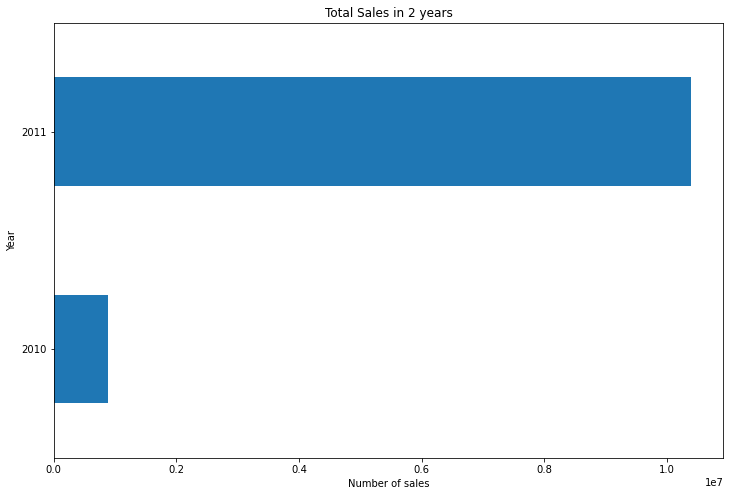

In [52]:
import matplotlib.pyplot as plt

df_year = df.groupby(by=['year']).sum()['Sales'].plot(kind='barh', figsize=(12, 8))
plt.title('Total Sales in 2 years')
plt.xlabel('Number of sales')
plt.ylabel('Year')

# Display the plot
plt.show()


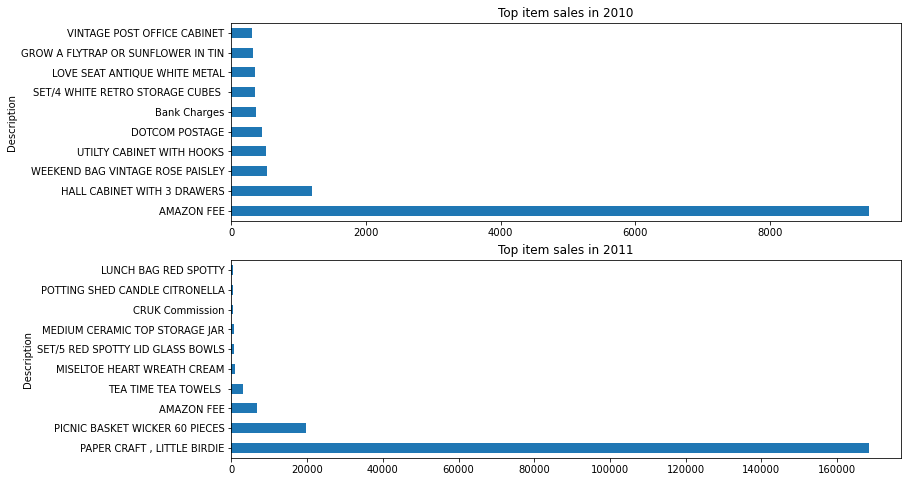

In [54]:
plt.subplot(2,1,1)
# creating the bar plot
df_sales_item_2010 = df.groupby(['Description','year']).mean()
df_sales_item_2010 = df_sales_item_2010.unstack('year')['Sales']
df_sales_item_2010 = df_sales_item_2010.sort_values(2010,ascending=False)[2010].head(10).plot(kind='barh',figsize=(12,8))
plt.title("Top item sales in 2010")
plt.subplot(2,1,2)
df_sales_item_2011 = df.groupby(['Description','year']).mean()
df_sales_item_2011 = df_sales_item_2011.unstack('year')['Sales']
df_sales_item_2011 = df_sales_item_2011.sort_values(2011,ascending=False)[2011].head(10).plot(kind='barh',figsize=(12,8))

plt.title("Top item sales in 2011")

plt.show()

#### Month

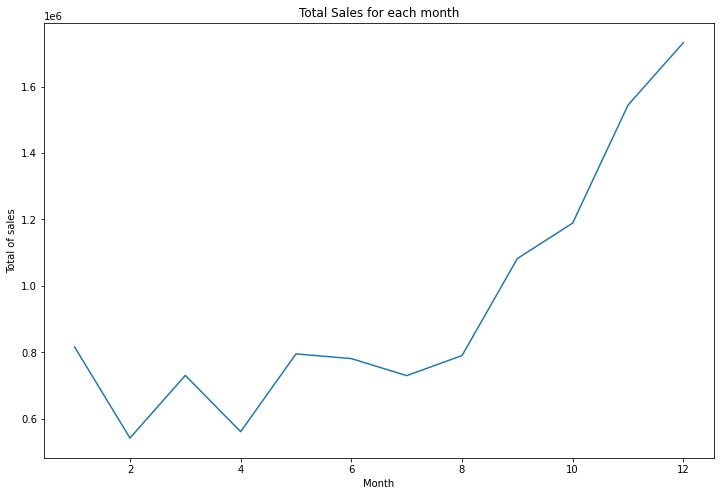

In [56]:
df_month = df.groupby(by=['month']).sum()['Sales'].plot(kind='line',figsize=(12,8))
plt.title('Total Sales for each month')
plt.ylabel('Total of sales')
plt.xlabel('Month')

plt.show()

#### Day of Week

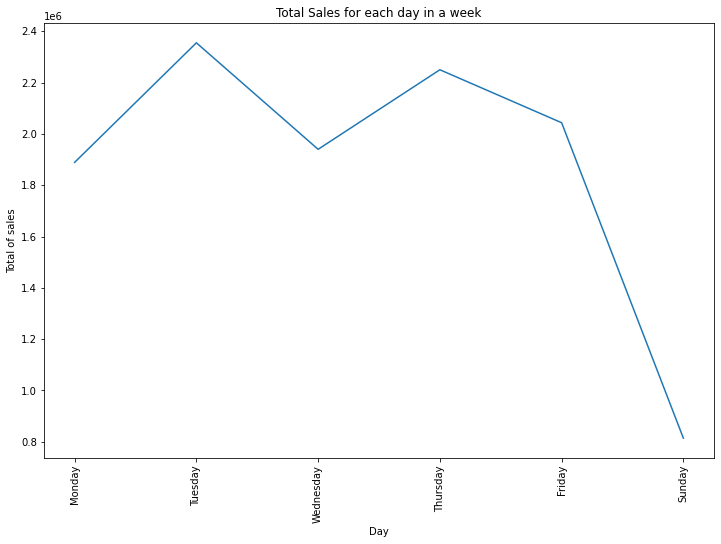

In [58]:
df_dayofweek = df.groupby(by=['dayofweek']).sum().sort_values('weekday',ascending=True)['Sales']\
.plot(kind='line',figsize=(12,8))
plt.title('Total Sales for each day in a week')
plt.ylabel('Total of sales')
plt.xlabel('Day')
plt.xticks(rotation=90)

plt.show()

#### Time_of_day

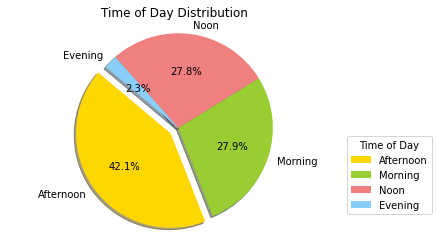

In [60]:
counts = df['Time of Day'].value_counts()

# Data
labels = counts.index.tolist()
sizes = counts.tolist()
colors = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue']
explode = (0.1, 0, 0, 0)  # explode 1st slice

# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.title('Time of Day Distribution')

plt.axis('equal')
plt.legend(title='Time of Day', loc='best', bbox_to_anchor=(1, 0.5))

plt.show()

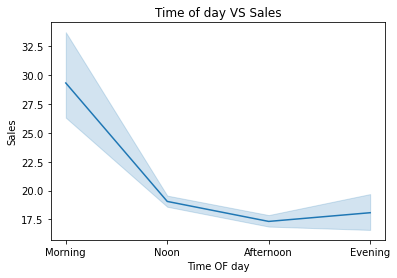

In [62]:
sns.lineplot(data= df,x="Time of Day", y ='Sales')
plt.xlabel("Time OF day")
plt.ylabel("Sales")
plt.title("Time of day VS Sales")

plt.show()

### Product Analysis

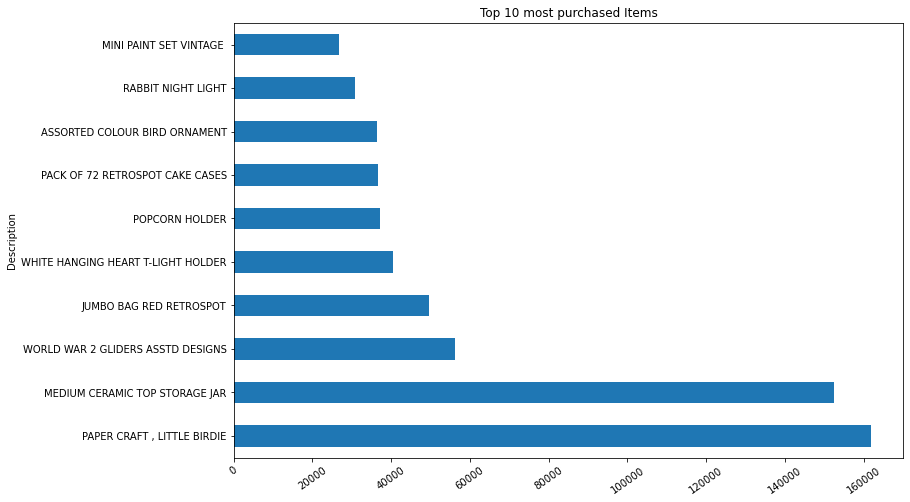

In [63]:
df_purchased_item = df.groupby('Description').sum()
df_purchased_item = df_purchased_item.sort_values('Quantity',ascending=False).head(10)
df_purchased_item['Quantity'].plot(kind = 'barh',figsize=(12,8))
plt.xticks(rotation=35)
plt.title("Top 10 most purchased Items")
# Save the plot as a PNG image
plt.savefig('top_purchase.png', format='png', bbox_inches='tight')
plt.show()

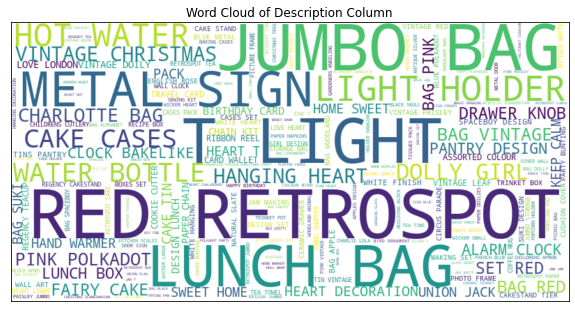

In [40]:
text = ' '.join(df['Description'].dropna().astype(str).values)

# Create a WordCloud object
wordcloud = WordCloud(background_color='white', width=800, height=400).generate(text)

# Create a matplotlib figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Display the word cloud on the axis
ax.imshow(wordcloud, interpolation='bilinear')
ax.set_title('Word Cloud of Description Column')

# Remove axis ticks
ax.set_xticks([])
ax.set_yticks([])

# Show the plot
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_18400\1743039491.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\user\AppData\Local\Temp\ipykernel_18400\1743039491.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



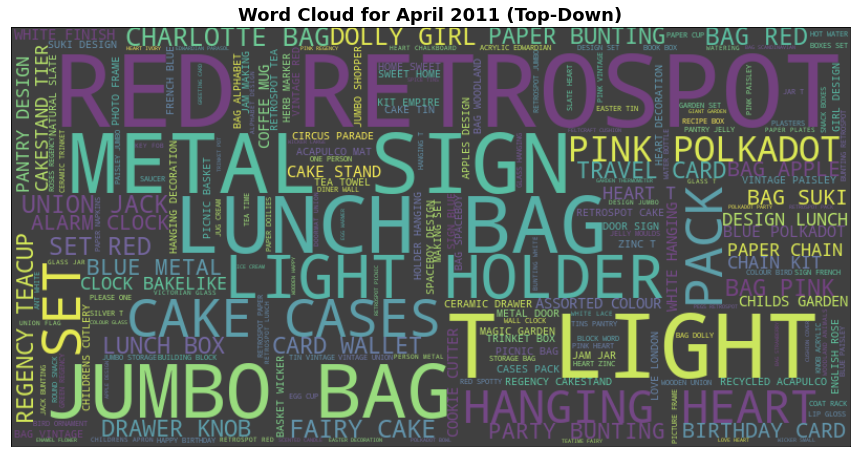

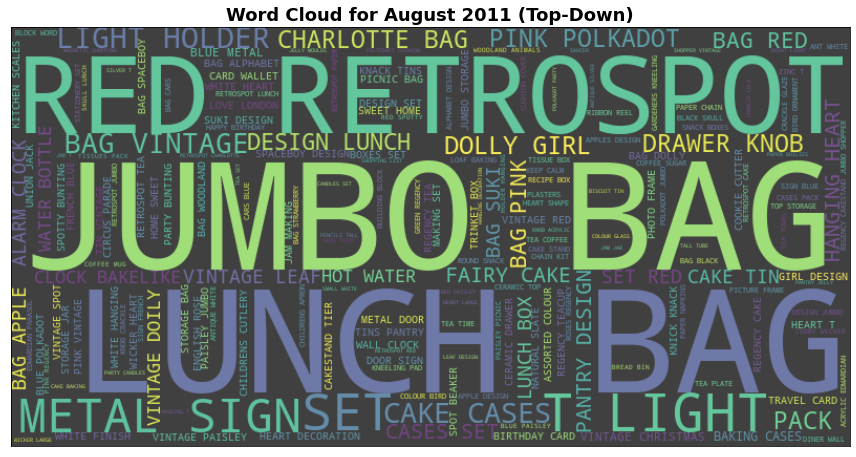

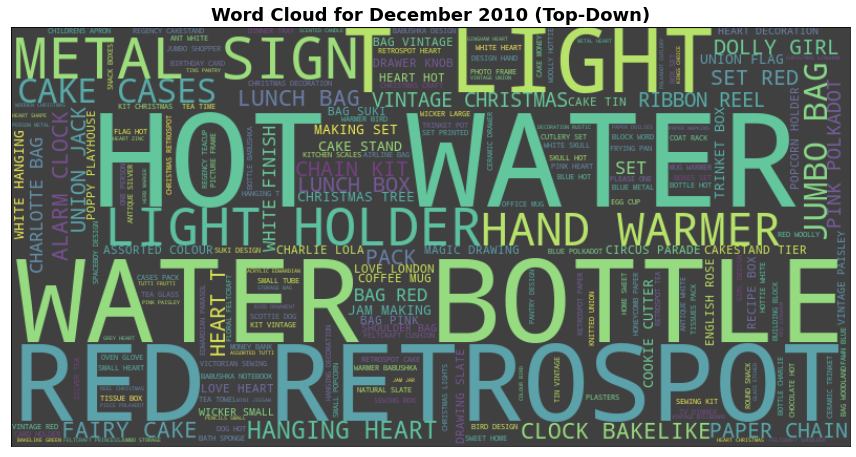

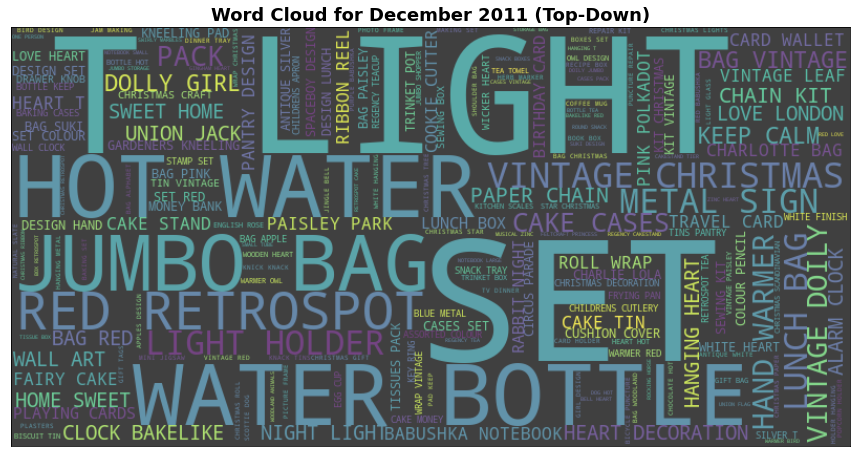

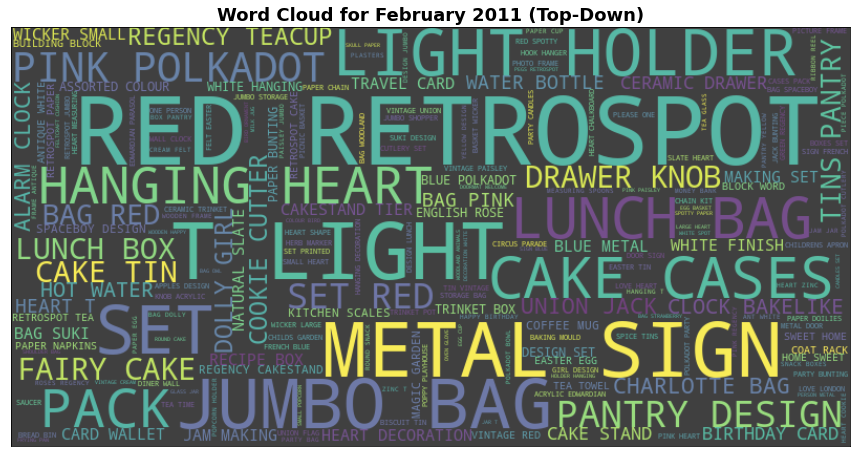

...

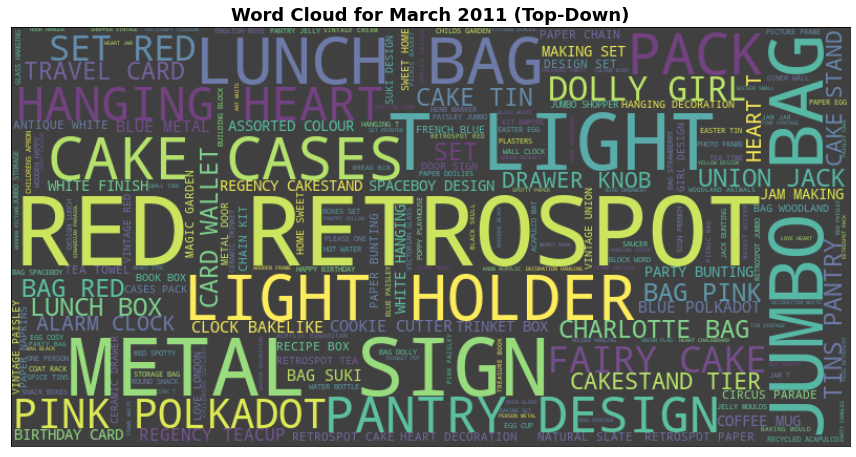

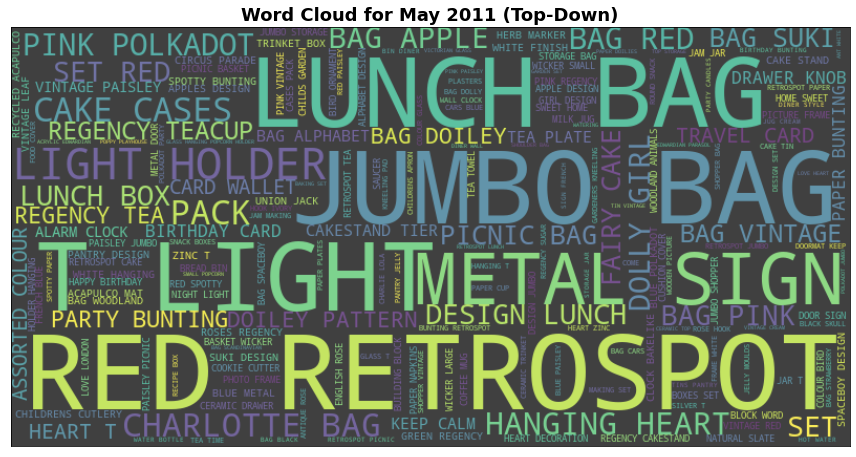

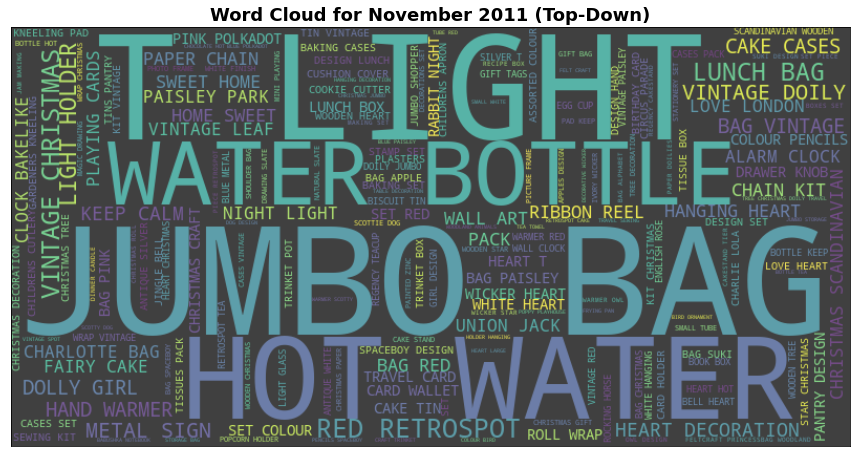

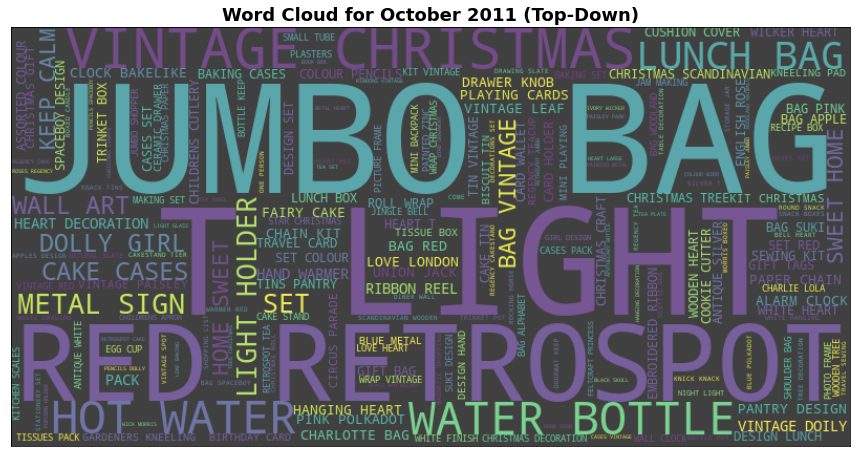

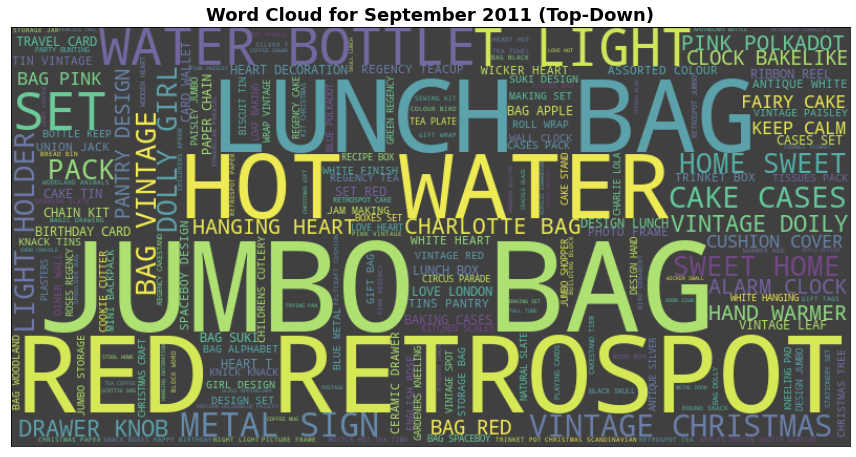

In [41]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Extract the month from the 'InvoiceDate' column
df['Month'] = df['InvoiceDate'].dt.strftime('%B %Y')

# Concatenate all the 'Description' values for each month into a single string
text_by_month = df.groupby('Month')['Description'].apply(lambda x: ' '.join(x.dropna().astype(str).values))

# Loop through each month and display the word cloud in a separate plot
for month, text in text_by_month.items():
    # Create a WordCloud object
    wordcloud = WordCloud(background_color='black', width=800, height=400).generate(text)

    # Create a new plot for the current month
    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(wordcloud, interpolation='bilinear', alpha=0.75)
    ax.set_title('Word Cloud for {} (Top-Down)'.format(month), fontsize=18, fontweight='bold')
    ax.set_xticks([])
    ax.set_yticks([])
    plt.tight_layout()
    plt.show()

# Data Modeling

In [42]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Select relevant features for clustering
X = df[['Quantity', 'UnitPrice', 'CustomerID']]

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled

array([[-2.28165086e-02, -2.35147619e-02,  1.72760227e+00],
       [-2.28165086e-02, -1.19831136e-02,  1.72760227e+00],
       [-1.35789146e-02, -2.07691313e-02,  1.72760227e+00],
       ...,
       [-3.20541026e-02, -1.54971749e-03, -1.75145387e+00],
       [-3.20541026e-02, -1.54971749e-03, -1.75145387e+00],
       [-3.66728996e-02,  9.43280472e-03, -1.75145387e+00]])

## Elbow Methods with SSE(Sum of Squares Errors)

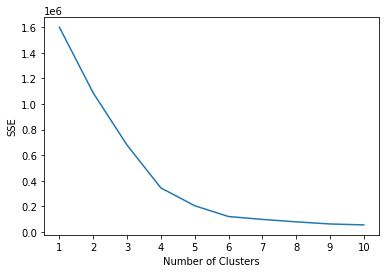

In [43]:
# Determine optimal number of clusters using elbow method
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    sse.append(kmeans.inertia_)

plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

## Kmeans

In [44]:
# Perform clustering with optimal number of clusters
kmeans = KMeans(n_clusters=6, random_state=42)
kmeans.fit(X_scaled)
clusters = kmeans.predict(X_scaled)

# Add cluster labels to the data
df['Cluster'] = clusters

# Analyze the clusters
cluster_analysis = df.groupby('Cluster').agg({
    'Quantity': ['mean', 'median'],
    'UnitPrice': ['mean', 'median'],
    'CustomerID': 'count'
})

print(cluster_analysis)

             Quantity              UnitPrice           CustomerID
                 mean   median          mean    median      count
Cluster                                                          
0           12.094760      4.0      2.853047      1.93     132007
1           14.053116      6.0      3.186824      1.95     128078
2        77605.000000  77605.0      1.560000      1.56          4
3            1.000000      1.0   6013.772800   5876.40         25
4            7.788794      2.0      4.470975      2.46     273307
5            1.000000      1.0  14607.933750  13541.33          8


C:\Users\user\AppData\Local\Temp\ipykernel_18400\3685222877.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:
# cluster distribution by country 

pivot = pd.pivot_table(df, index='Country', columns='Cluster', values='CustomerID', aggfunc='count', fill_value=0)
percentages = (pivot.div(pivot.sum(axis=1), axis=0) * 100).round(2)
print(percentages)

Cluster                   0       1    2     3       4    5
Country                                                    
Australia              1.27   98.73  0.0  0.00    0.00  0.0
Austria                0.00  100.00  0.0  0.00    0.00  0.0
Bahrain                0.00   89.47  0.0  0.00   10.53  0.0
Belgium                0.00  100.00  0.0  0.00    0.00  0.0
Brazil                 0.00  100.00  0.0  0.00    0.00  0.0
Canada                93.38    0.00  0.0  0.00    6.62  0.0
Channel Islands        0.00    0.00  0.0  0.00  100.00  0.0
Cyprus                 0.00  100.00  0.0  0.00    0.00  0.0
Czech Republic         0.00  100.00  0.0  0.00    0.00  0.0
Denmark                0.00  100.00  0.0  0.00    0.00  0.0
EIRE                   0.00   19.30  0.0  0.00   80.70  0.0
European Community     0.00    0.00  0.0  0.00  100.00  0.0
Finland                0.00  100.00  0.0  0.00    0.00  0.0
France                 0.00   96.66  0.0  0.00    3.34  0.0
Germany                0.00   99.37  0.0

In [46]:
from tabulate import tabulate

# Assuming you have a DataFrame named df
description_table = percentages

# Convert the table to Markdown format
markdown_table = tabulate(description_table, headers='keys', tablefmt='pipe')

# Print the Markdown table
print(markdown_table)

| Country              |     0 |      1 |   2 |    3 |      4 |   5 |
|:---------------------|------:|-------:|----:|-----:|-------:|----:|
| Australia            |  1.27 |  98.73 |   0 | 0    |   0    |   0 |
| Austria              |  0    | 100    |   0 | 0    |   0    |   0 |
| Bahrain              |  0    |  89.47 |   0 | 0    |  10.53 |   0 |
| Belgium              |  0    | 100    |   0 | 0    |   0    |   0 |
| Brazil               |  0    | 100    |   0 | 0    |   0    |   0 |
| Canada               | 93.38 |   0    |   0 | 0    |   6.62 |   0 |
| Channel Islands      |  0    |   0    |   0 | 0    | 100    |   0 |
| Cyprus               |  0    | 100    |   0 | 0    |   0    |   0 |
| Czech Republic       |  0    | 100    |   0 | 0    |   0    |   0 |
| Denmark              |  0    | 100    |   0 | 0    |   0    |   0 |
| EIRE                 |  0    |  19.3  |   0 | 0    |  80.7  |   0 |
| European Community   |  0    |   0    |   0 | 0    | 100    |   0 |
| Finland           